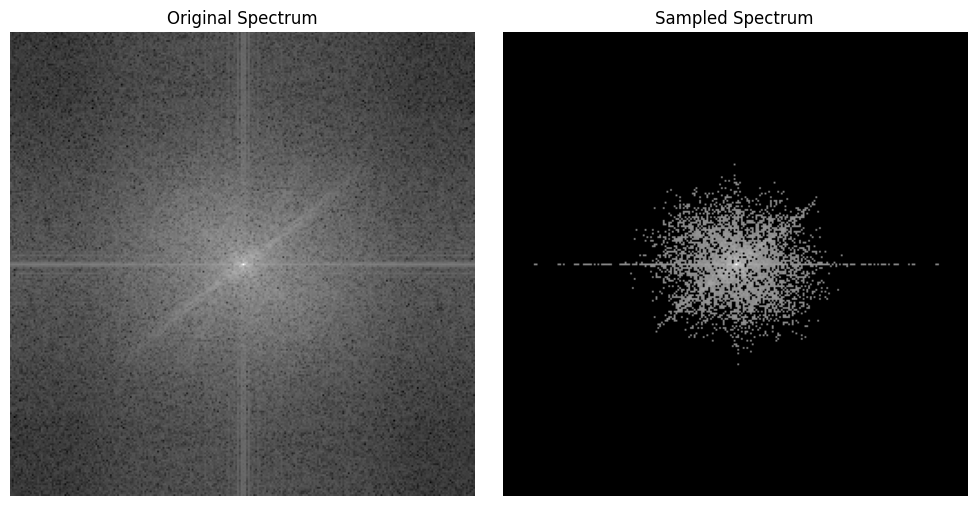

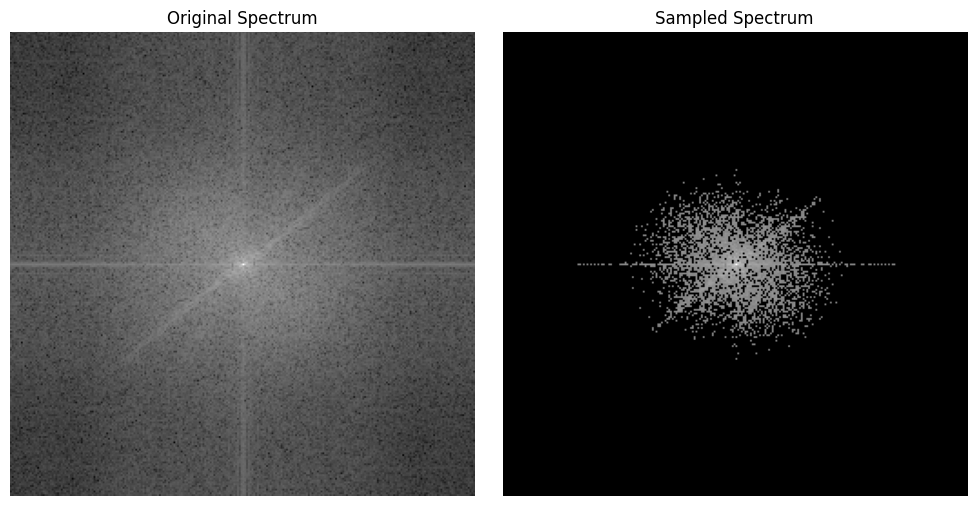

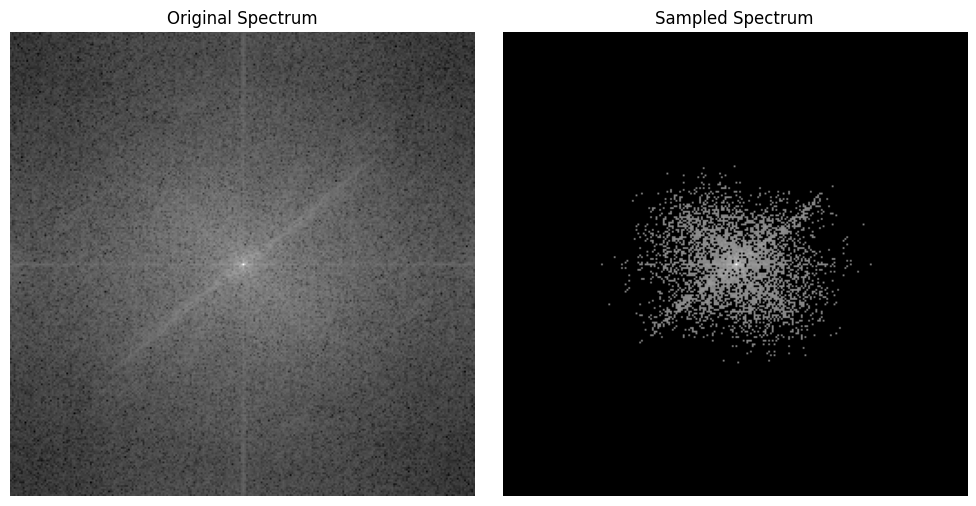

SolverError: Solver 'ECOS' failed. Try another solver, or solve with verbose=True for more information.

In [2]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np

path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_84.jpg'


# compress and decompress oringinal image
# Read the image and separate RGB channels
image_ = io.imread(path)
red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

random_ratio = 0.90

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel.shape, random_ratio)

ratio = 20

# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel, mask_m, cr=ratio)
compressed_green_m = plot_comparison_spectrum(green_channel, mask_m, cr=ratio)
compressed_blue_m = plot_comparison_spectrum(blue_channel, mask_m, cr=ratio)

# reconstruct the image
reconstructed_red_m = compressive_sensing_reconstruction(red_channel, mask_m, mode='quantile', cr=ratio)
reconstructed_green_m = compressive_sensing_reconstruction(green_channel, mask_m, mode='quantile', cr=ratio)
reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel, mask_m, mode='quantile', cr=ratio)

#scale back to 0-255
reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# # Compressive sensing reconstruction for each channel
# reconstructed_red_m = compressive_sensing_reconstruction(red_channel_m, mask_m, mode='quantile', cr=100)
# reconstructed_green_m = compressive_sensing_reconstruction(green_channel_m, mask_m, mode='quantile', cr=100)
# reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel_m, mask_m, mode='quantile', cr=100)

# #scale back to 0-255
# reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
# reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
# reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# Combine reconstructed channels
reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
#io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)

plt.figure(figsize=(10,10))
plt.imshow(reconstructed_image_m)
plt.show()

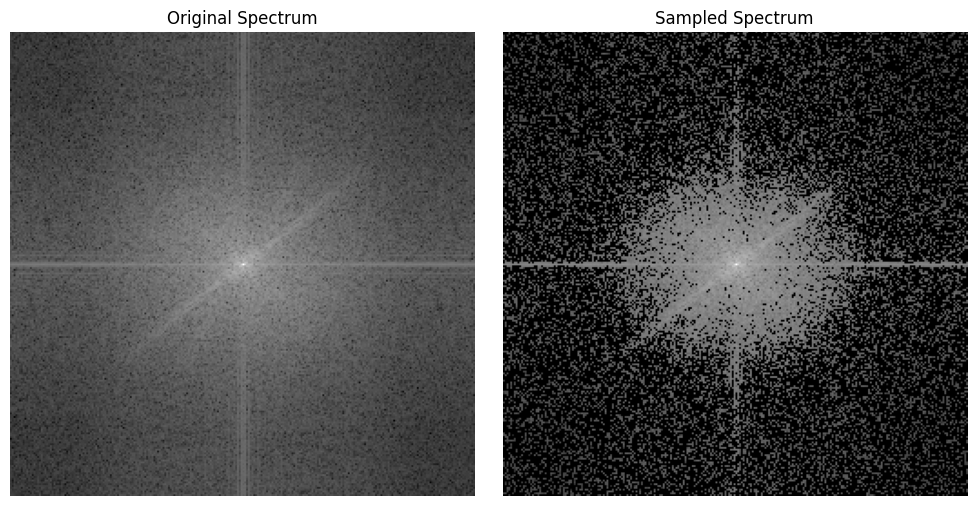

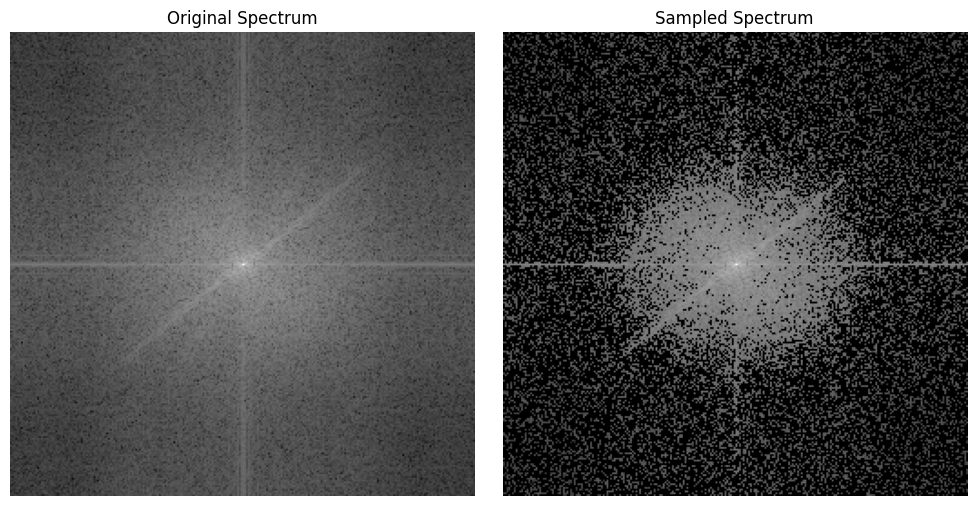

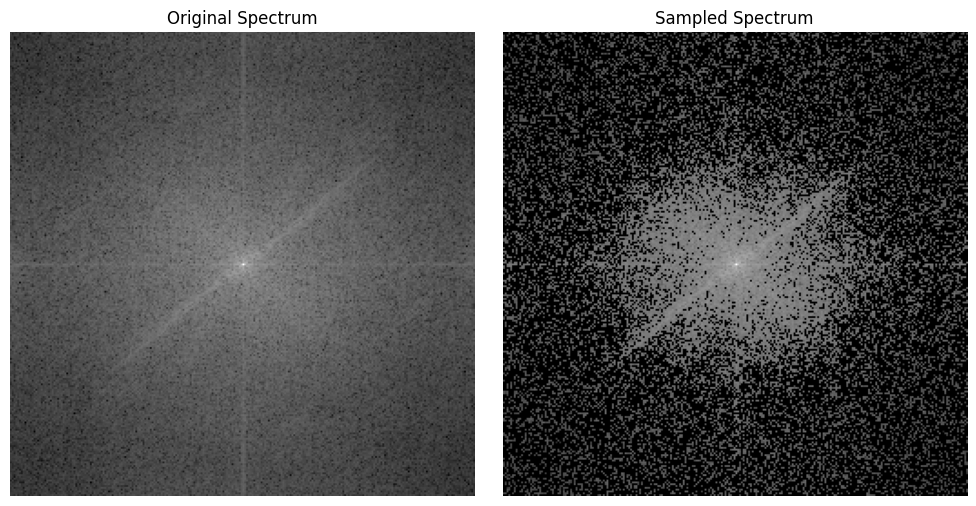

/mnt/data/chuanhao/anaconda3/envs/deepspace/lib/python3.8/site-packages/cvxpy/reductions/solvers/solving_chain.py:336: FutureWarning: 
    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    
  warnings.warn(ECOS_DEPRECATION_MSG, FutureWarning)


ValueError: cannot reshape array of size 1 into shape (256,256)

In [1]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np
from numpy.fft import fft2, ifft2

path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_84.jpg'


# compress and decompress oringinal image
# Read the image and separate RGB channels
image_ = io.imread(path)
red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

random_ratio = 0.70

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel.shape, 1-random_ratio)

ratio = 10

# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel, mask_m, cr=ratio, mode='keep')
compressed_green_m = plot_comparison_spectrum(green_channel, mask_m, cr=ratio, mode='keep')
compressed_blue_m = plot_comparison_spectrum(blue_channel, mask_m, cr=ratio, mode='keep')

# reconstruct the image
reconstructed_red_m = compressive_sensing_reconstruction(red_channel, mask_m, mode='quantile', cr=ratio, mask_mode='keep')
reconstructed_green_m = compressive_sensing_reconstruction(green_channel, mask_m, mode='quantile', cr=ratio, mask_mode='keep')
reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel, mask_m, mode='quantile', cr=ratio, mask_mode='keep')

#scale back to 0-255
reconstructed_red_m = reconstructed_red_m#/reconstructed_red_m.max() * red_channel.max()
reconstructed_green_m = reconstructed_green_m#/reconstructed_green_m.max() * green_channel.max()
reconstructed_blue_m = reconstructed_blue_m#/reconstructed_blue_m.max() * blue_channel.max()

# combine reconstructed channels
reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
compressed_image_m = np.stack([np.abs(ifft2(compressed_red_m)), np.abs(ifft2(compressed_green_m)), np.abs(ifft2(compressed_blue_m))], axis=-1).astype(np.uint8)

plt.figure(figsize=(10,10))
plt.imshow(reconstructed_image_m)
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(compressed_image_m)
plt.show()



(256, 256, 3)
255
17


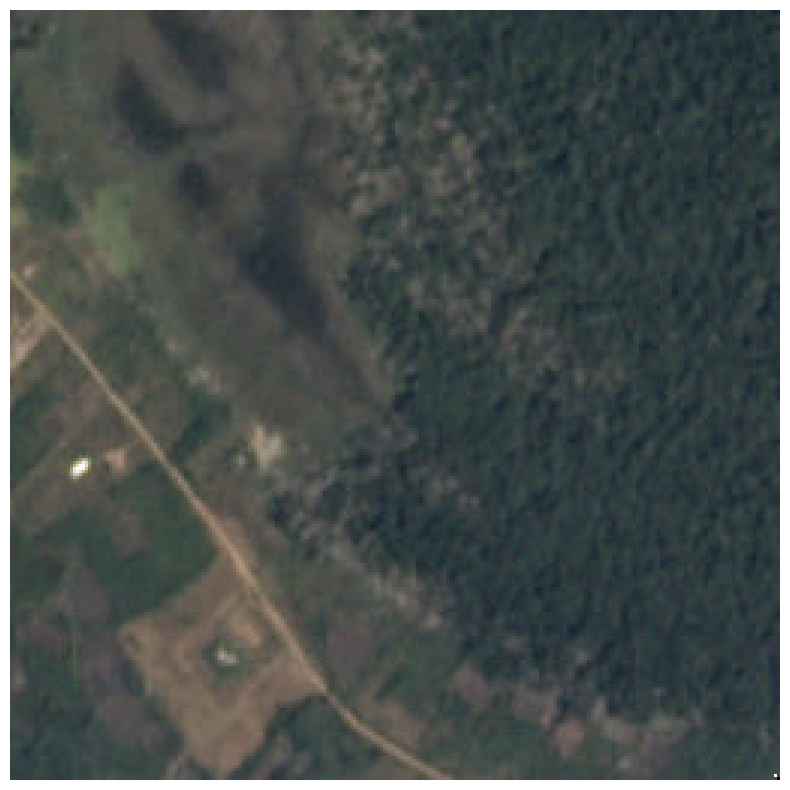

Actual CR: 49.98932112890923


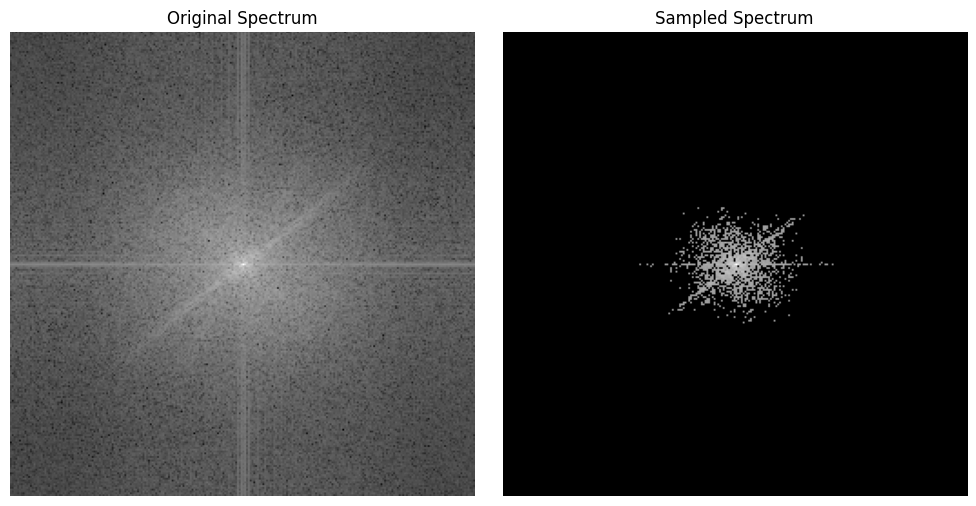

Actual CR: 49.98932112890923


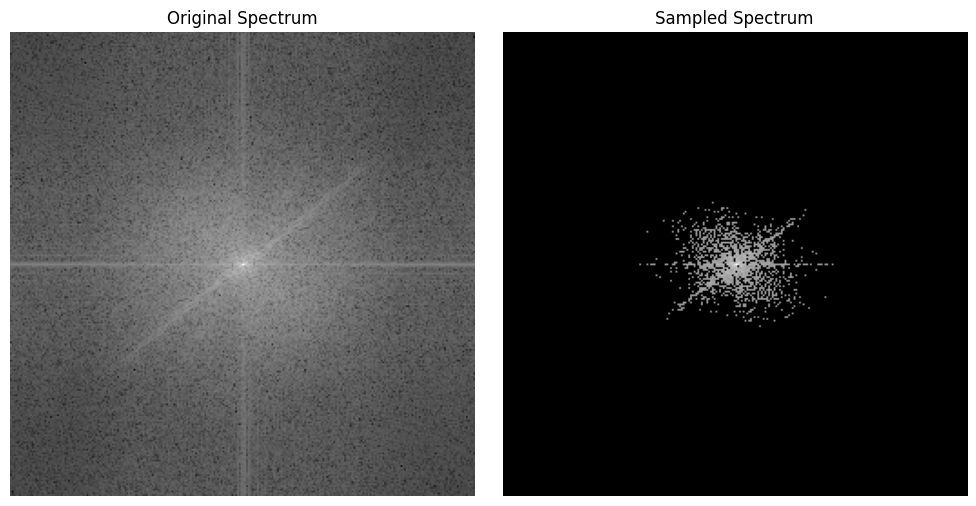

Actual CR: 49.951219512195124


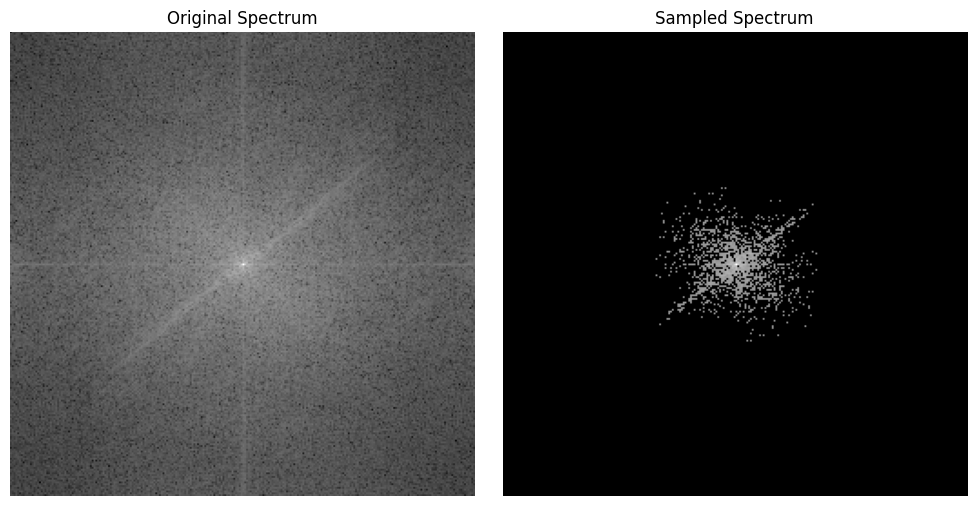

Actual CR: 49.98932112890923
Actual CR: 49.98932112890923
Actual CR: 49.951219512195124


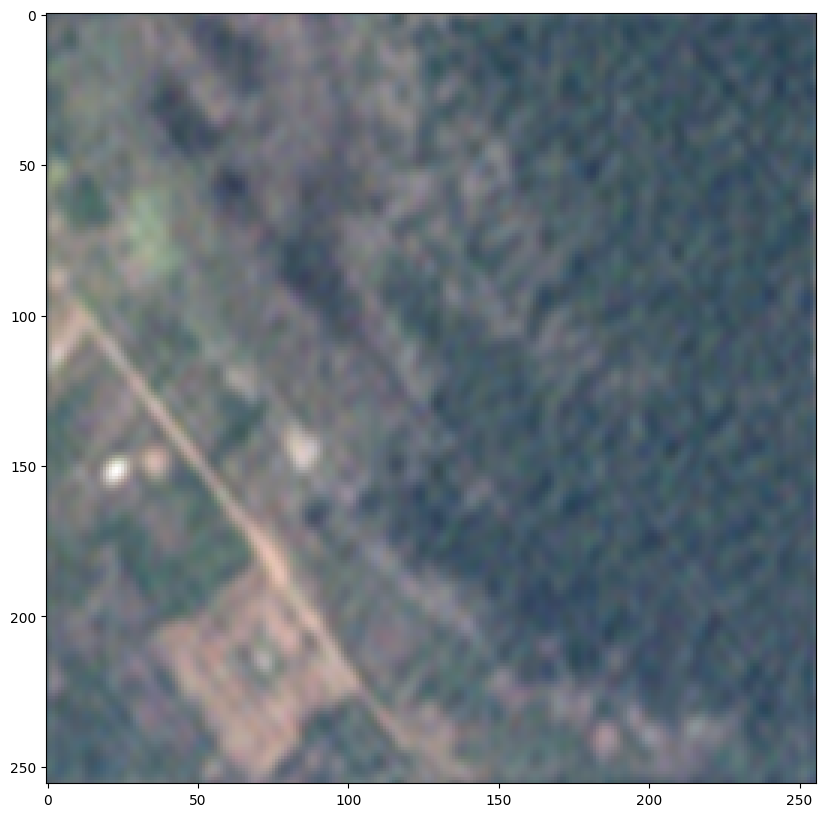

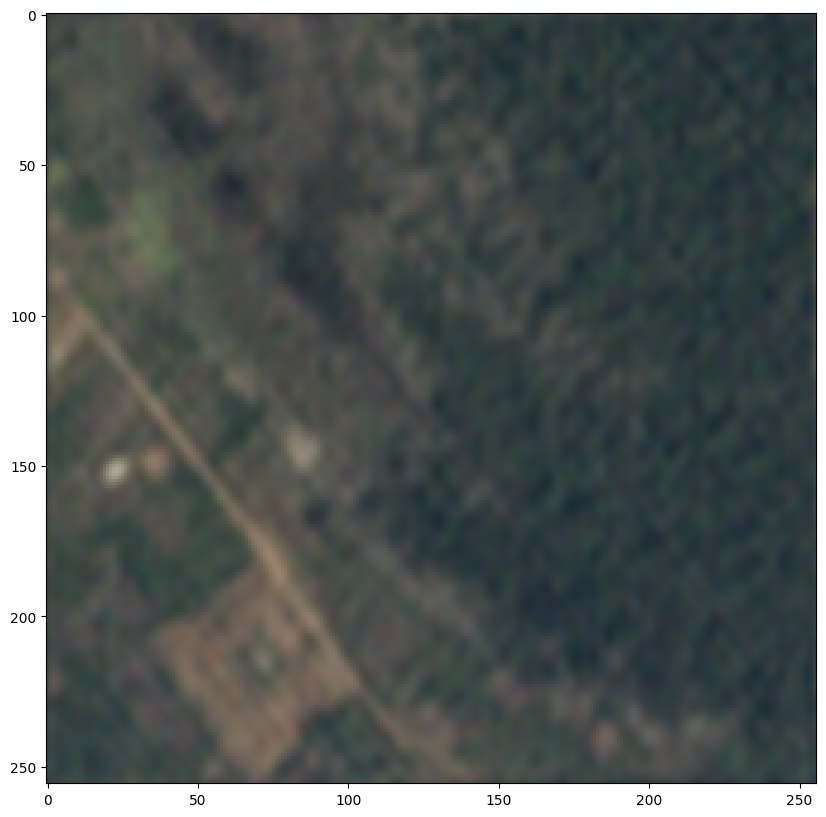

(256, 256, 3)
(256, 256, 3)
0.6991844101474873


In [2]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np
from skimage.metrics import structural_similarity as compare_ssim
from PIL import Image

def compute_ssim(img1, img2):
    # Ensure the images have the same shape
    print(img1.shape)
    print(img2.shape)
    assert img1.shape == img2.shape, "The images must have the same size and number of channels"

    # Compute SSIM for each channel
    ssim_r = compare_ssim(img1[:,:,0], img2[:,:,0])
    ssim_g = compare_ssim(img1[:,:,1], img2[:,:,1])
    ssim_b = compare_ssim(img1[:,:,2], img2[:,:,2])

    # Average the SSIM values of the channels
    ssim_avg = (ssim_r + ssim_g + ssim_b) / 3

    return ssim_avg

path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_84.jpg'

# modulate masks
image = Image.open(path)
image = image.convert('RGB')
mod = np.array(image)
print(mod.shape)
print(mod.max())
print(mod.min())
mod[-1, -1, 0] = 0
mod[-1, -1, 1] = 0
mod[-1, -1, 2] = 0
mod[-2, -2, 0] = 255
mod[-2, -2, 1] = 255
mod[-2, -2, 2] = 255

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(mod)
plt.show()

# compress and decompress oringinal image
# Read the image and separate RGB channels
image_ = Image.open(path)
image_ = image.convert('RGB')
image_ = np.array(image_)

red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

# compress and decompress modulated image
red_channel_m = mod[:,:,0]
green_channel_m = mod[:,:,1]
blue_channel_m = mod[:,:,2]

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel_m.shape, 0.90)

# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel_m, mask_m, cr=50)
compressed_green_m = plot_comparison_spectrum(green_channel_m, mask_m, cr=50)
compressed_blue_m = plot_comparison_spectrum(blue_channel_m, mask_m, cr=50)

# Compressive sensing reconstruction for each channel
reconstructed_red_m = compressive_sensing_reconstruction(red_channel_m, mask_m, mode='quantile', cr=50)
reconstructed_green_m = compressive_sensing_reconstruction(green_channel_m, mask_m, mode='quantile', cr=50)
reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel_m, mask_m, mode='quantile', cr=50)

#scale back to 0-255
reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# Combine reconstructed channels
reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)
plt.figure(figsize=(10,10))
plt.imshow(reconstructed_image_m)
plt.show()

compressed_image_m = np.stack([np.abs(ifft2(compressed_red_m)), np.abs(ifft2(compressed_green_m)), np.abs(ifft2(compressed_blue_m))], axis=-1).astype(np.uint8)
plt.figure(figsize=(10,10))
plt.imshow(compressed_image_m)
plt.show()

# compute ssim
ssim = compute_ssim(image_, reconstructed_image_m)
print(ssim)

(256, 256, 3)
101
43


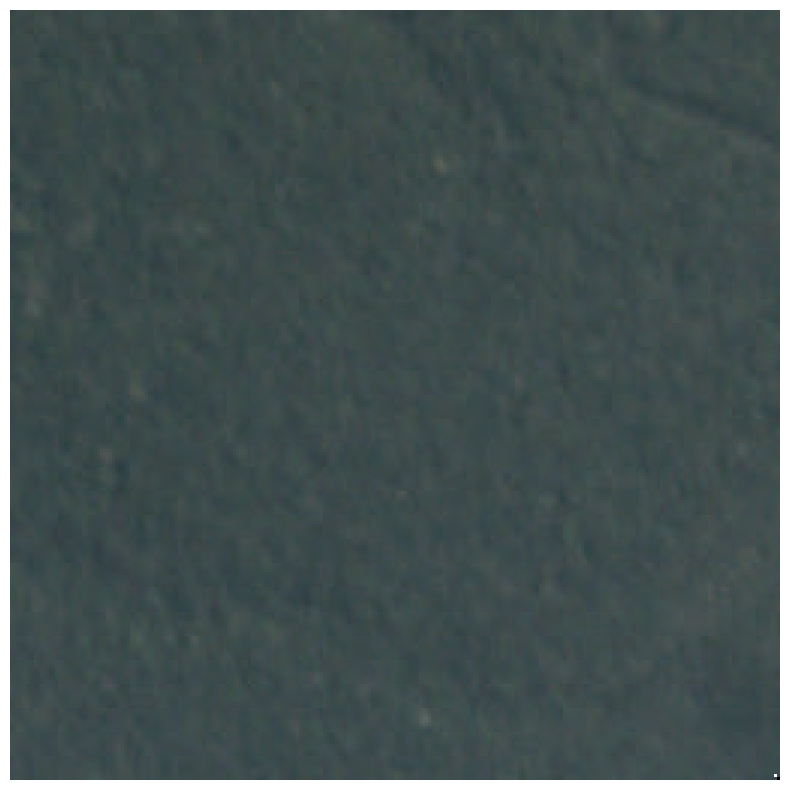

Actual CR: 49.98932112890923


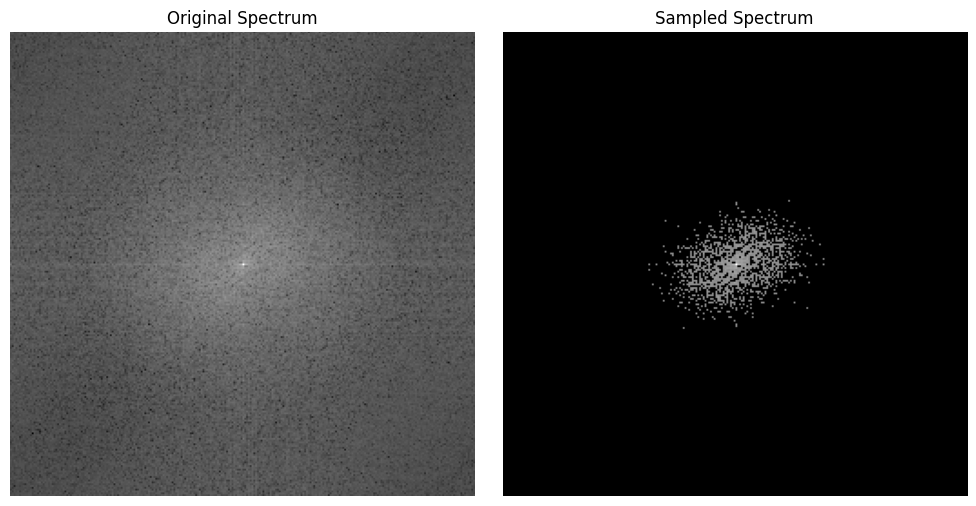

Actual CR: 49.98932112890923


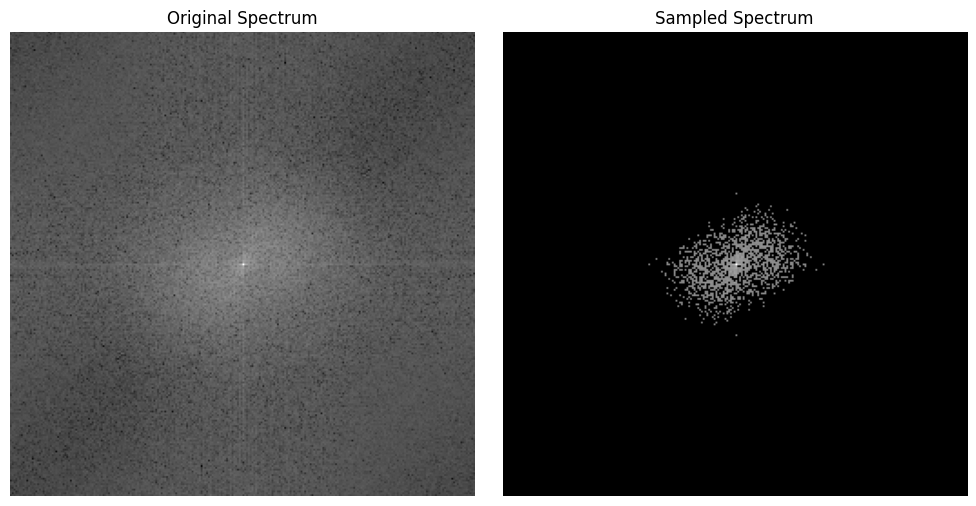

Actual CR: 49.98932112890923


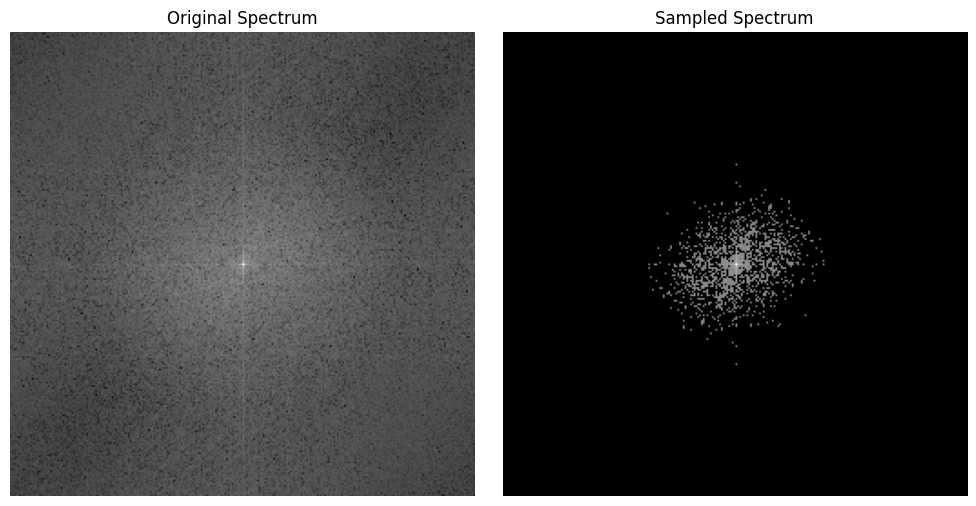

Actual CR: 49.98932112890923
Actual CR: 49.98932112890923
Actual CR: 49.98932112890923


/tmp/ipykernel_2761035/113196627.py:80: UserWarning: reconstructed_m10_2.jpg is a low contrast image
  io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)


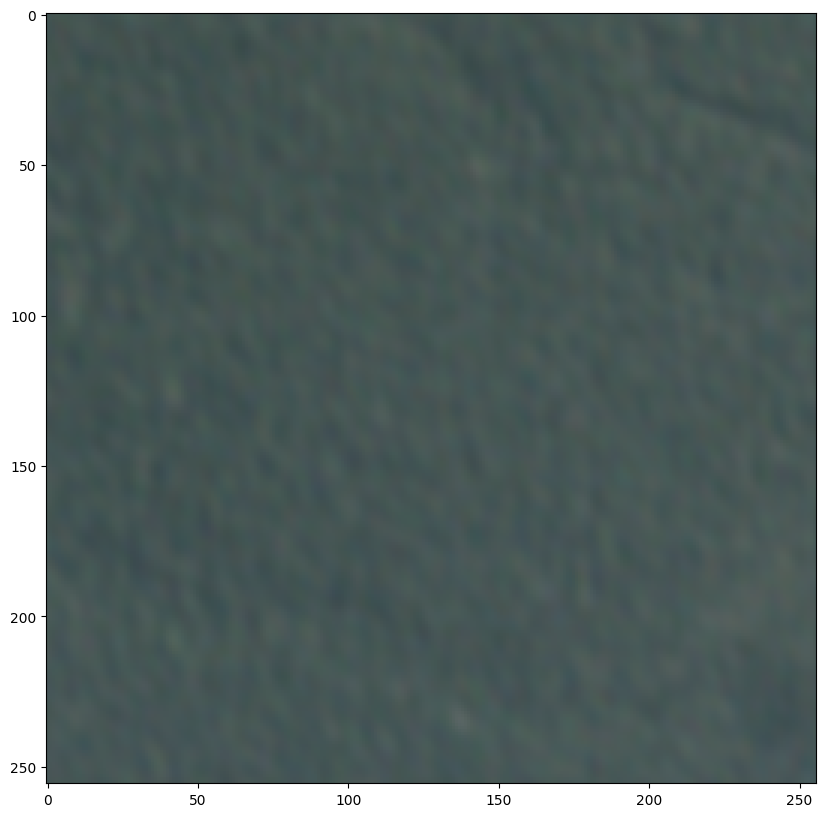

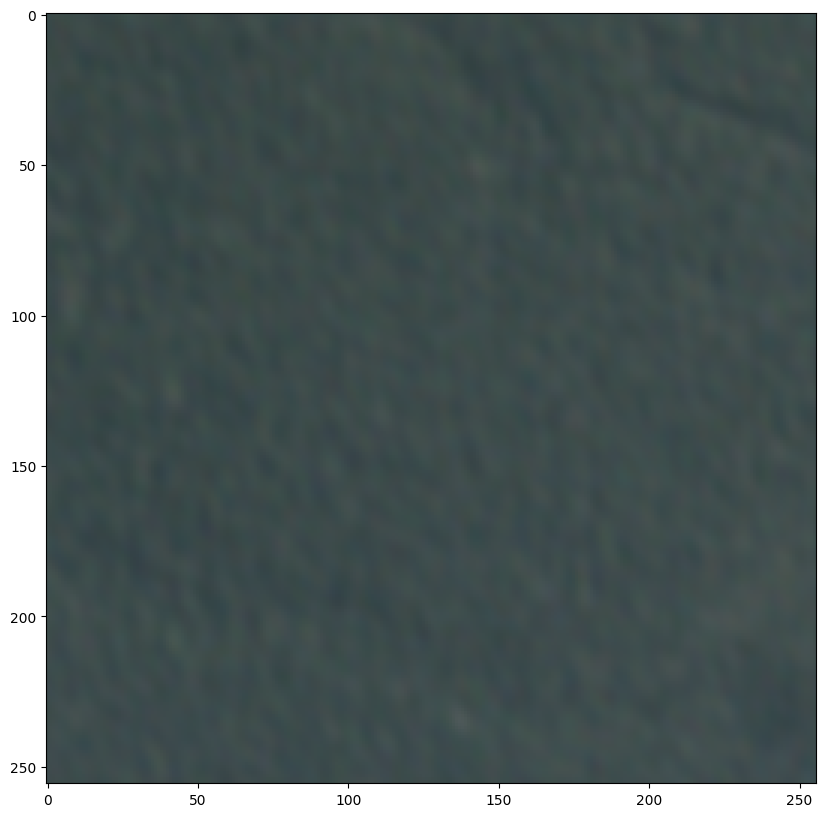

(256, 256, 3)
(256, 256, 3)
0.935355444457433


In [3]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np
from skimage.metrics import structural_similarity as compare_ssim
from PIL import Image

def compute_ssim(img1, img2):
    # Ensure the images have the same shape
    print(img1.shape)
    print(img2.shape)
    assert img1.shape == img2.shape, "The images must have the same size and number of channels"

    # Compute SSIM for each channel
    ssim_r = compare_ssim(img1[:,:,0], img2[:,:,0])
    ssim_g = compare_ssim(img1[:,:,1], img2[:,:,1])
    ssim_b = compare_ssim(img1[:,:,2], img2[:,:,2])

    # Average the SSIM values of the channels
    ssim_avg = (ssim_r + ssim_g + ssim_b) / 3

    return ssim_avg

path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_44.jpg'

# modulate masks
image = Image.open(path)
image = image.convert('RGB')
mod = np.array(image)
print(mod.shape)
print(mod.max())
print(mod.min())
mod[-1, -1, 0] = 0
mod[-1, -1, 1] = 0
mod[-1, -1, 2] = 0
mod[-2, -2, 0] = 255
mod[-2, -2, 1] = 255
mod[-2, -2, 2] = 255

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(mod)
plt.show()

# compress and decompress oringinal image
# Read the image and separate RGB channels
image_ = Image.open(path)
image_ = image.convert('RGB')
image_ = np.array(image_)

red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

# compress and decompress modulated image
red_channel_m = mod[:,:,0]
green_channel_m = mod[:,:,1]
blue_channel_m = mod[:,:,2]

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel_m.shape, 0.99)

# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel_m, mask_m, cr=50)
compressed_green_m = plot_comparison_spectrum(green_channel_m, mask_m, cr=50)
compressed_blue_m = plot_comparison_spectrum(blue_channel_m, mask_m, cr=50)

# Compressive sensing reconstruction for each channel
reconstructed_red_m = compressive_sensing_reconstruction(red_channel_m, mask_m, mode='quantile', cr=50)
reconstructed_green_m = compressive_sensing_reconstruction(green_channel_m, mask_m, mode='quantile', cr=50)
reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel_m, mask_m, mode='quantile', cr=50)

#scale back to 0-255
reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# Combine reconstructed channels
reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)
plt.figure(figsize=(10,10))
plt.imshow(reconstructed_image_m)
plt.show()

compressed_image_m = np.stack([np.abs(ifft2(compressed_red_m)), np.abs(ifft2(compressed_green_m)), np.abs(ifft2(compressed_blue_m))], axis=-1).astype(np.uint8)
plt.figure(figsize=(10,10))
plt.imshow(compressed_image_m)
plt.show()

# compute ssim
ssim = compute_ssim(image_, reconstructed_image_m)
print(ssim)

(400, 400, 3)
116
20


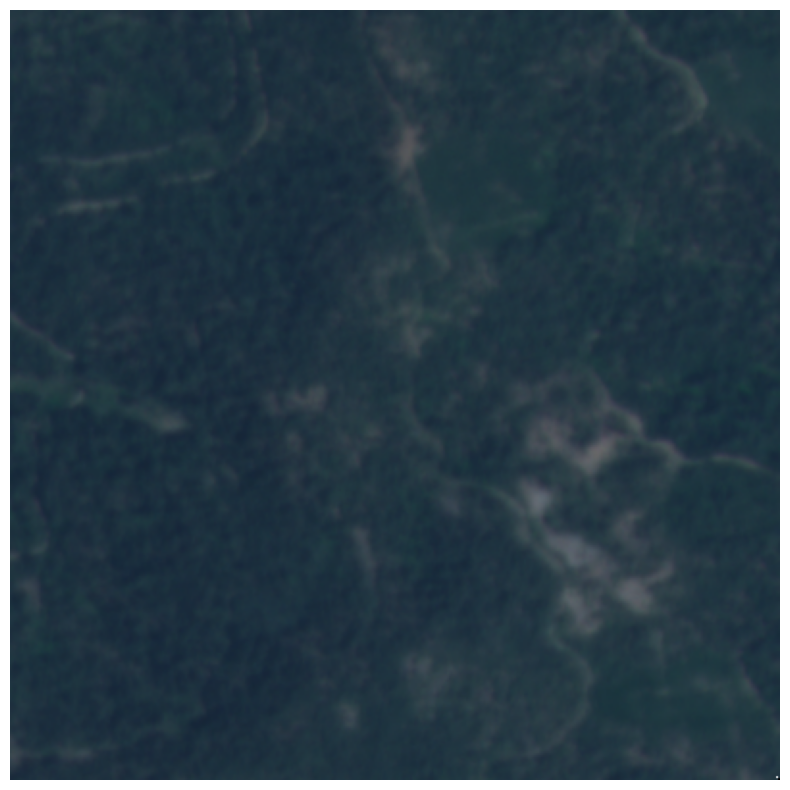

Actual CR: 20.0


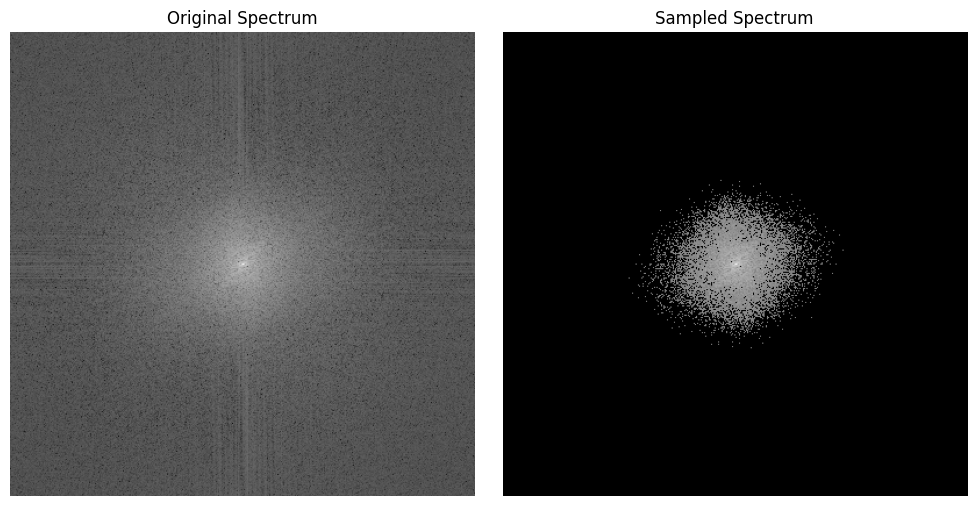

Actual CR: 20.0


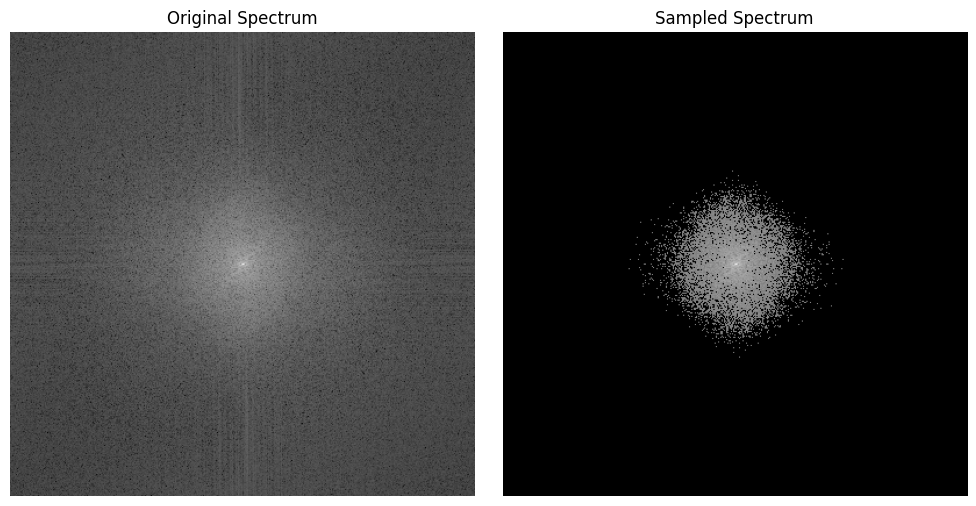

Actual CR: 20.0


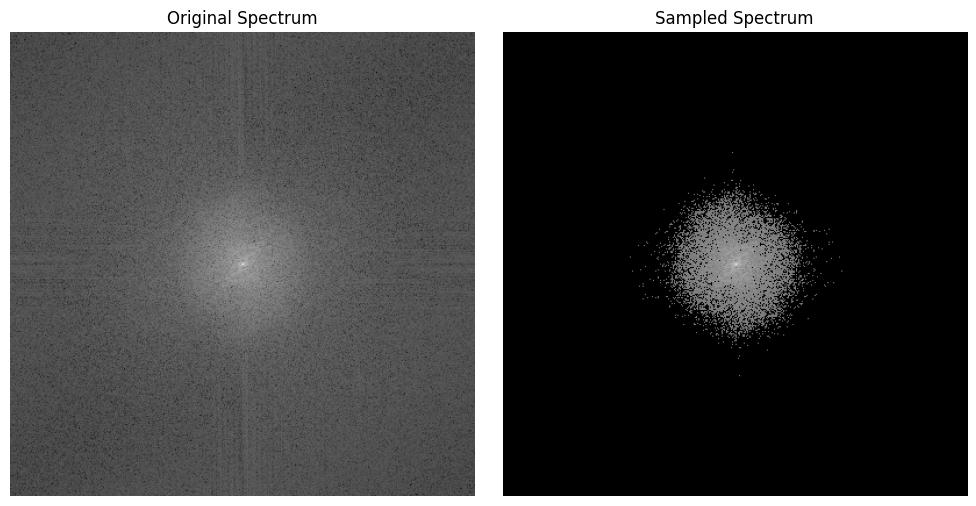

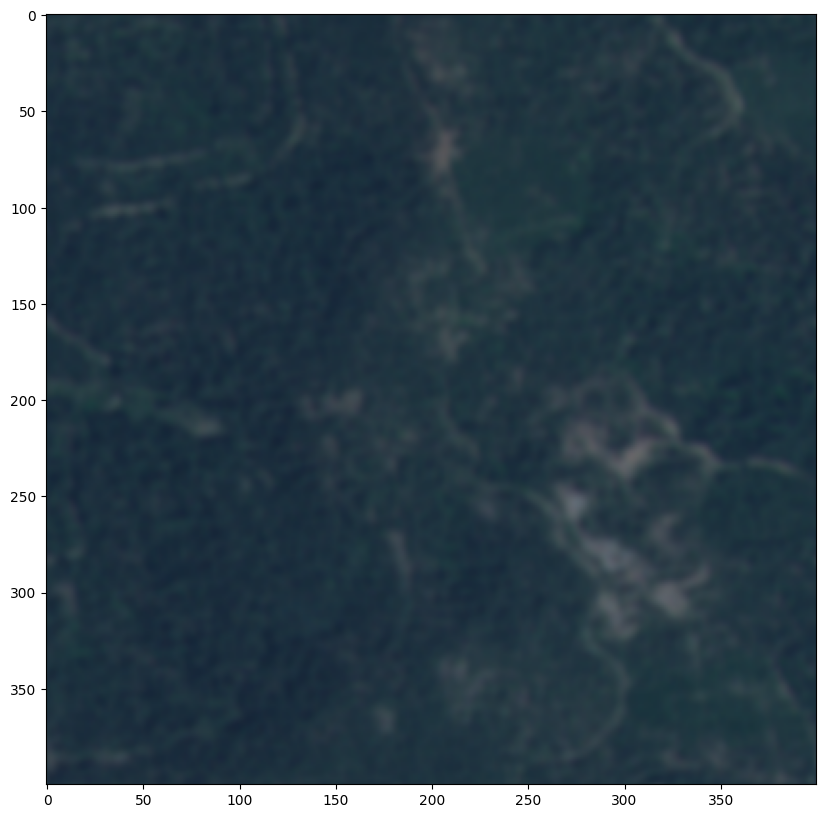

(400, 400, 3)
(400, 400, 3)
0.9846198313474331


In [11]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np
from skimage.metrics import structural_similarity as compare_ssim
from PIL import Image

def compute_ssim(img1, img2):
    # Ensure the images have the same shape
    print(img1.shape)
    print(img2.shape)
    assert img1.shape == img2.shape, "The images must have the same size and number of channels"

    # Compute SSIM for each channel
    ssim_r = compare_ssim(img1[:,:,0], img2[:,:,0])
    ssim_g = compare_ssim(img1[:,:,1], img2[:,:,1])
    ssim_b = compare_ssim(img1[:,:,2], img2[:,:,2])

    # Average the SSIM values of the channels
    ssim_avg = (ssim_r + ssim_g + ssim_b) / 3

    return ssim_avg

# path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_44.jpg'

direct_path = '/mnt/raid0sata1/chuanhao/CA/cropped/2021-07-01_2276.npy'

mod = np.load(direct_path, allow_pickle=True)[0]*255
image_ = np.load(direct_path, allow_pickle=True)[0]*255

mod = mod.astype(np.uint8)
image_ = image_.astype(np.uint8)

# modulate masks
# image = Image.open(path)
# image = image.convert('RGB')
# mod = np.array(image)
print(mod.shape)
print(mod.max())
print(mod.min())

mod[-1, -1, 0] = 0
mod[-1, -1, 1] = 0
mod[-1, -1, 2] = 0
mod[-2, -2, 0] = 255
mod[-2, -2, 1] = 255
mod[-2, -2, 2] = 255

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(mod)
plt.show()

# compress and decompress oringinal image
# Read the image and separate RGB channels
# image_ = Image.open(path)
# image_ = image.convert('RGB')
# image_ = np.array(image_)

red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

# compress and decompress modulated image
red_channel_m = mod[:,:,0]
green_channel_m = mod[:,:,1]
blue_channel_m = mod[:,:,2]

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel_m.shape, 0.999)
cr=20
# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel_m, mask_m, cr=cr)
compressed_green_m = plot_comparison_spectrum(green_channel_m, mask_m, cr=cr)
compressed_blue_m = plot_comparison_spectrum(blue_channel_m, mask_m, cr=cr)

# # Compressive sensing reconstruction for each channel
# reconstructed_red_m = compressive_sensing_reconstruction(red_channel_m, mask_m, mode='quantile', cr=50)
# reconstructed_green_m = compressive_sensing_reconstruction(green_channel_m, mask_m, mode='quantile', cr=50)
# reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel_m, mask_m, mode='quantile', cr=50)

# #scale back to 0-255
# reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
# reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
# reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# # Combine reconstructed channels
# reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
# io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)
# plt.figure(figsize=(10,10))
# plt.imshow(reconstructed_image_m)
# plt.show()

compressed_image_m = np.stack([np.abs(ifft2(compressed_red_m)), np.abs(ifft2(compressed_green_m)), np.abs(ifft2(compressed_blue_m))], axis=-1).astype(np.uint8)
plt.figure(figsize=(10,10))
plt.imshow(compressed_image_m)
plt.show()

# compute ssim
ssim = compute_ssim(image_, compressed_image_m)
print(ssim)

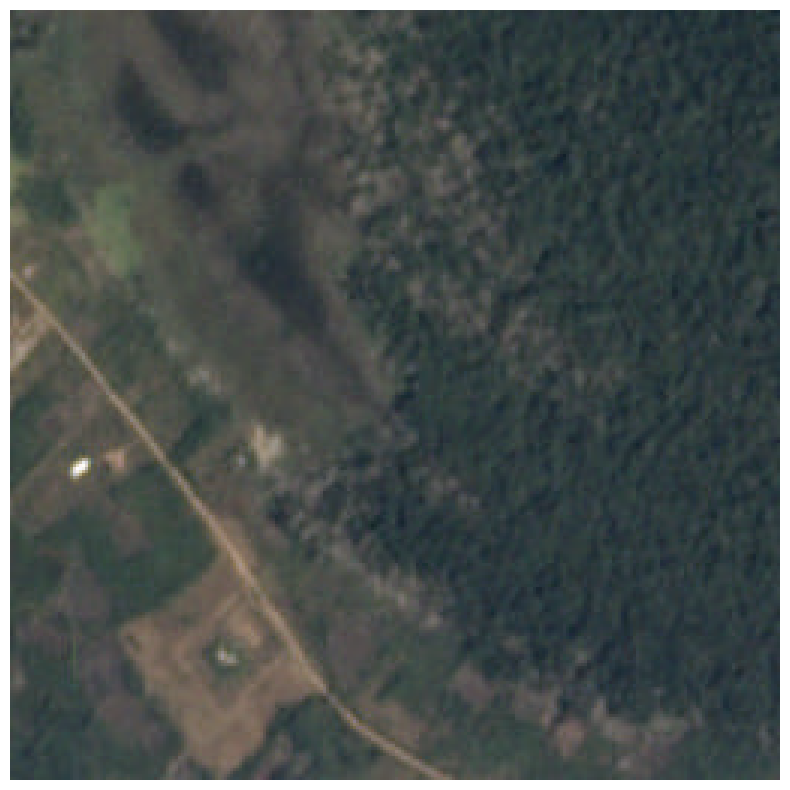

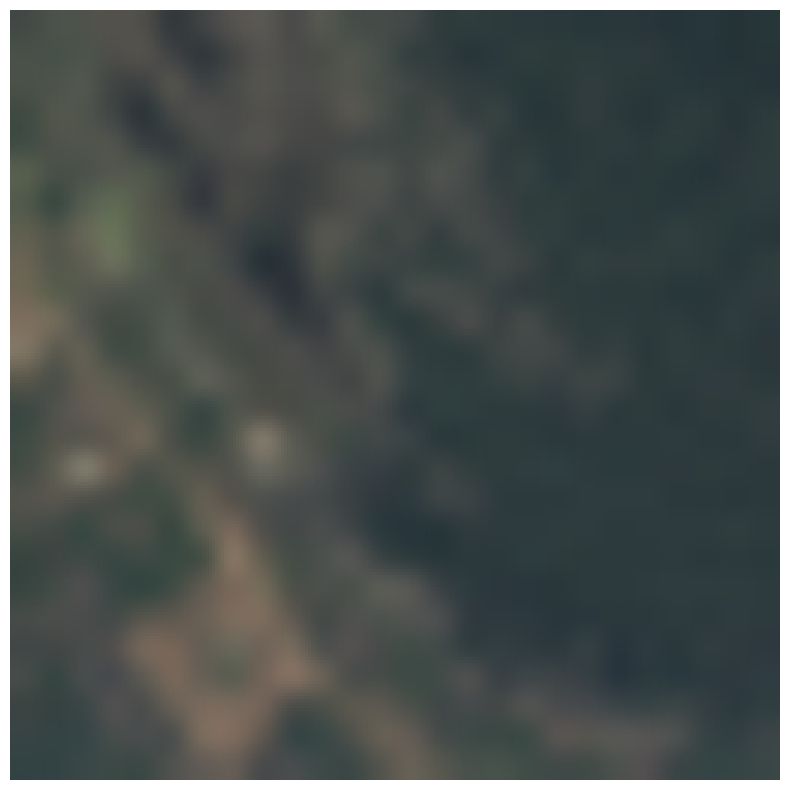

(256, 256, 4)
(256, 256, 4)
0.6924537051567873


In [6]:
from PIL import Image

# Load the image (replace 'path_to_image.jpg' with your image file)
image = Image.open('/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_84.jpg')

# show figure
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(image)
plt.show()

# Resize the image
new_size = (26, 26)
resized_image = image.resize(new_size)

# Save the resized image (replace 'path_to_resized_image.jpg' with your desired file name)
decode_size = (256,256)
decode_image = resized_image.resize(decode_size)

# show figure 
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(decode_image)
plt.show()

ssim = compute_ssim(np.array(image), np.array(decode_image))
print(ssim)

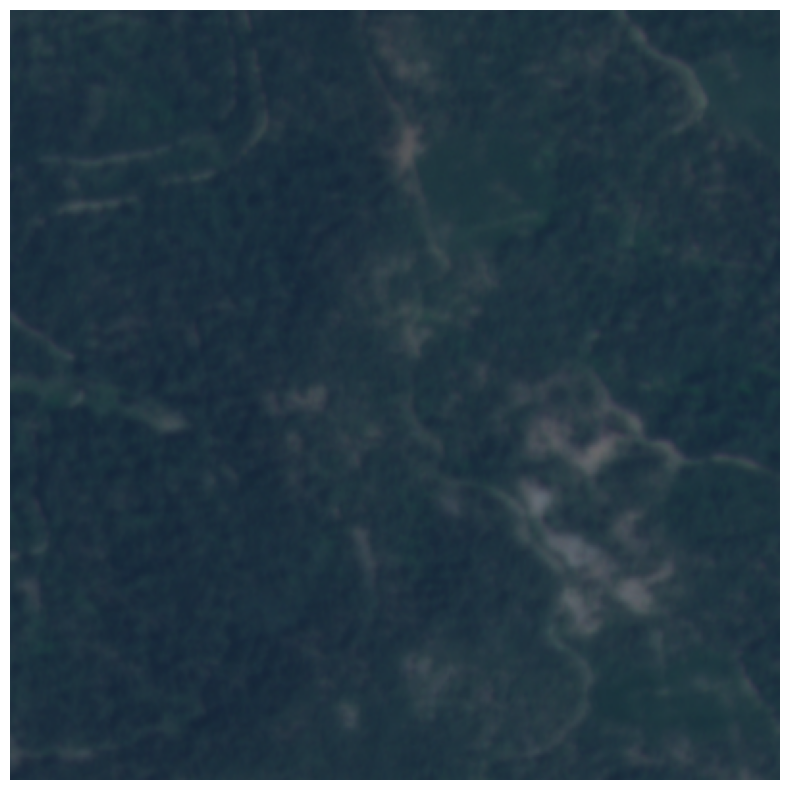

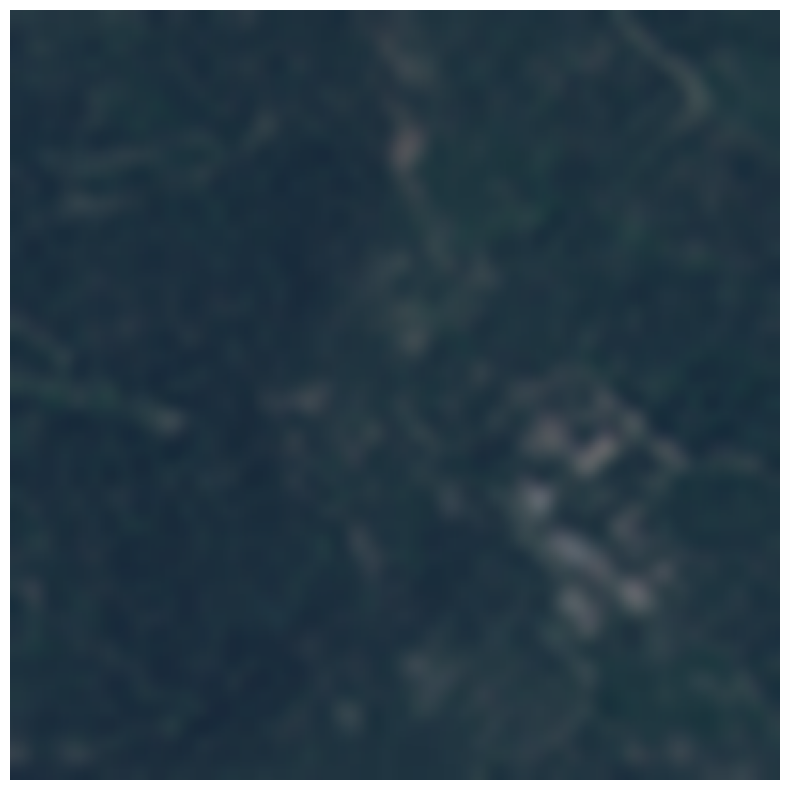

Actual CR: 100.0


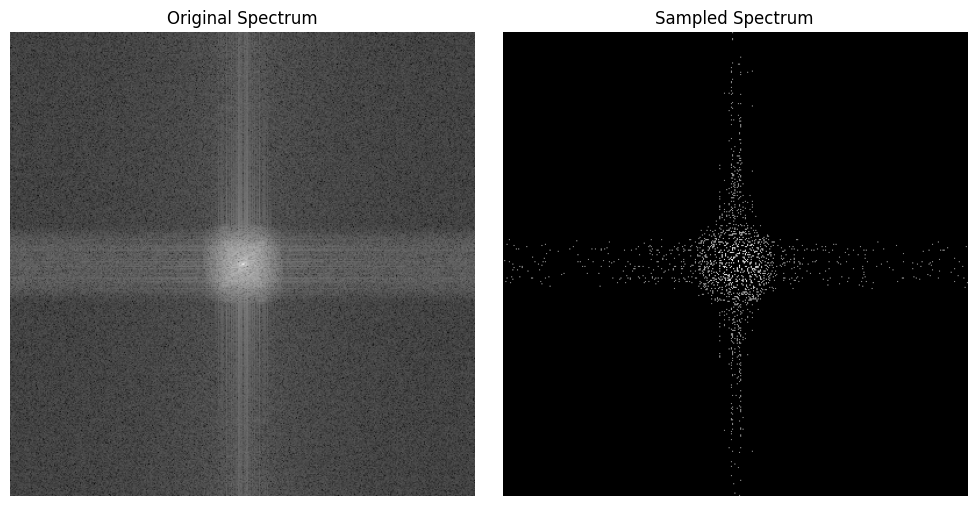

Actual CR: 100.0


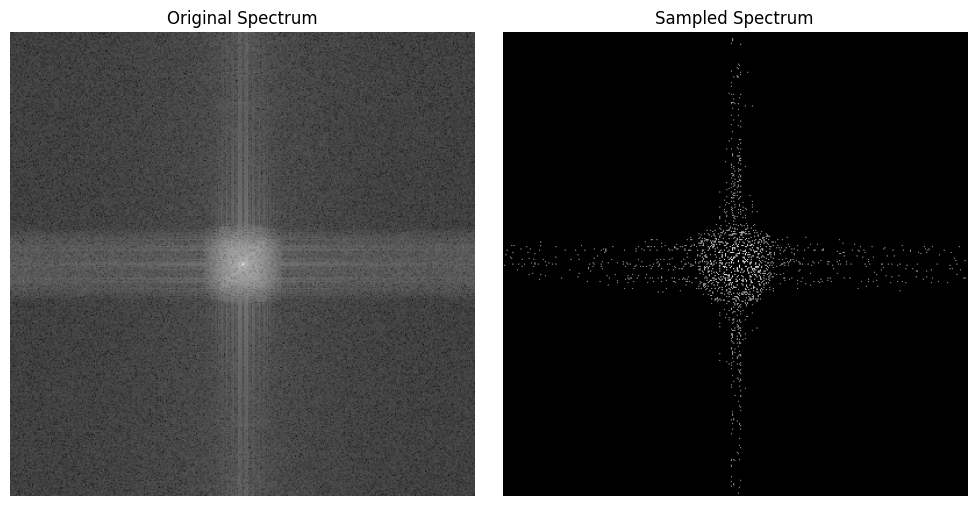

Actual CR: 100.0


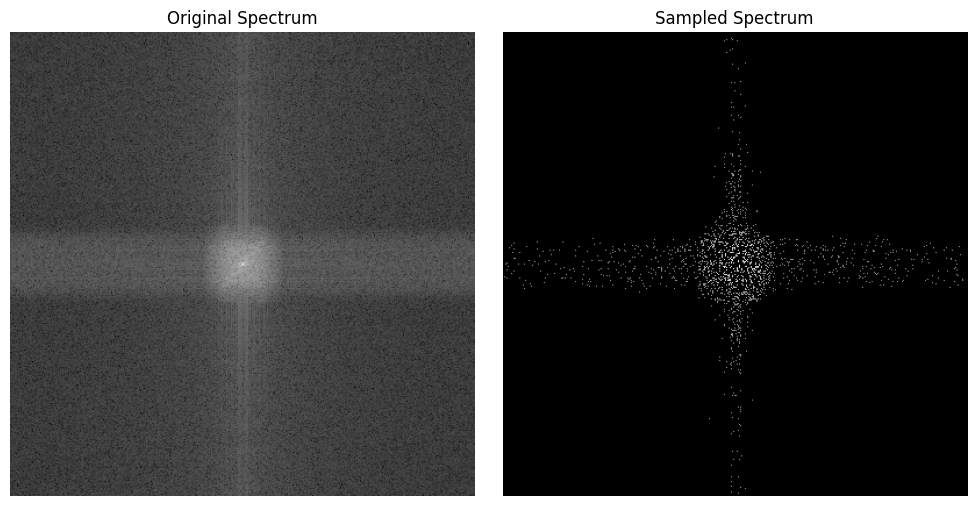

(400, 400, 3)
(400, 400, 3)
0.9390118030138238


In [18]:
from PIL import Image

# Load the image (replace 'path_to_image.jpg' with your image file)
# image = Image.open('/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_84.jpg')

direct_path = '/mnt/raid0sata1/chuanhao/CA/cropped/2021-07-01_2276.npy'

image = np.load(direct_path, allow_pickle=True)[0]*255

# turn to uint8

image = image.astype(np.uint8)

# load with PIL

image = Image.fromarray(image)

# show figure
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(image)
plt.show()

# Resize the image
new_size = (50, 50)
resized_image = image.resize(new_size, Image.LANCZOS)

# Save the resized image (replace 'path_to_resized_image.jpg' with your desired file name)
decode_size = (400,400)
decode_image = resized_image.resize(decode_size, Image.LANCZOS)

# show figure 
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(decode_image)
plt.show()

# compress the image
compressed_blue_m = plot_comparison_spectrum(np.array(decode_image)[:,:,0], mask_m, cr=100)
compressed_green_m = plot_comparison_spectrum(np.array(decode_image)[:,:,1], mask_m, cr=100)
compressed_red_m = plot_comparison_spectrum(np.array(decode_image)[:,:,2], mask_m, cr=100)

ssim = compute_ssim(np.array(image), np.array(decode_image))
print(ssim)

(400, 400, 3)
116
20


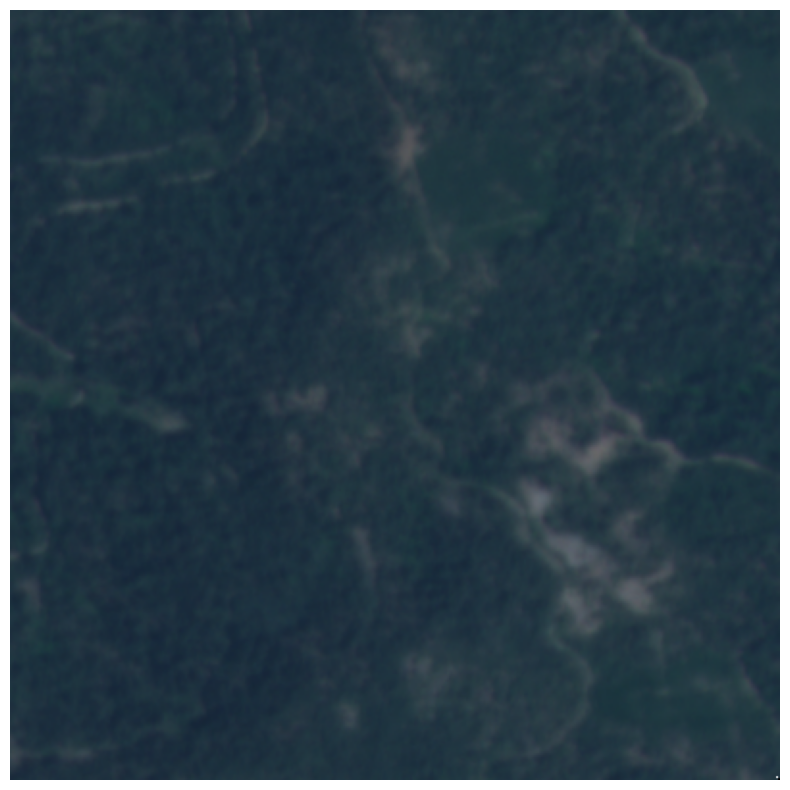

Actual CR: 123.36160370084811


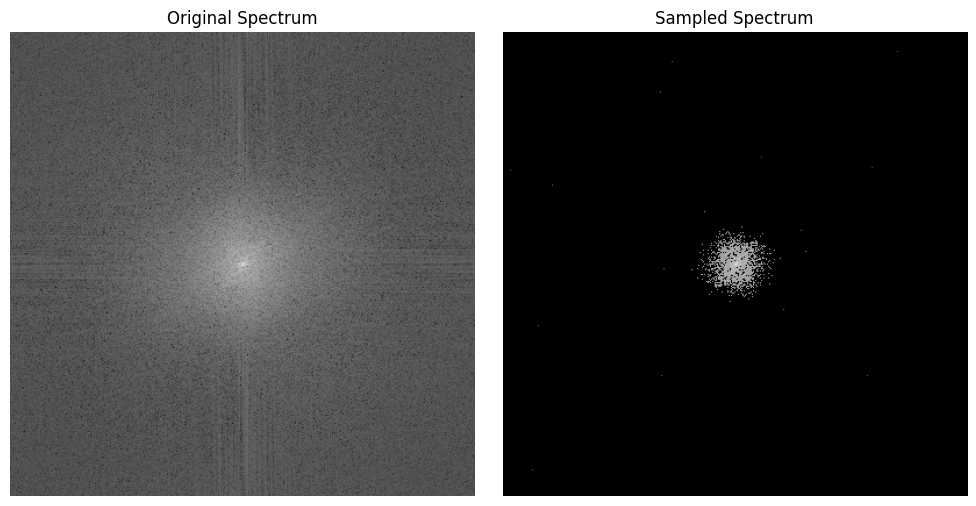

Actual CR: 123.36160370084811


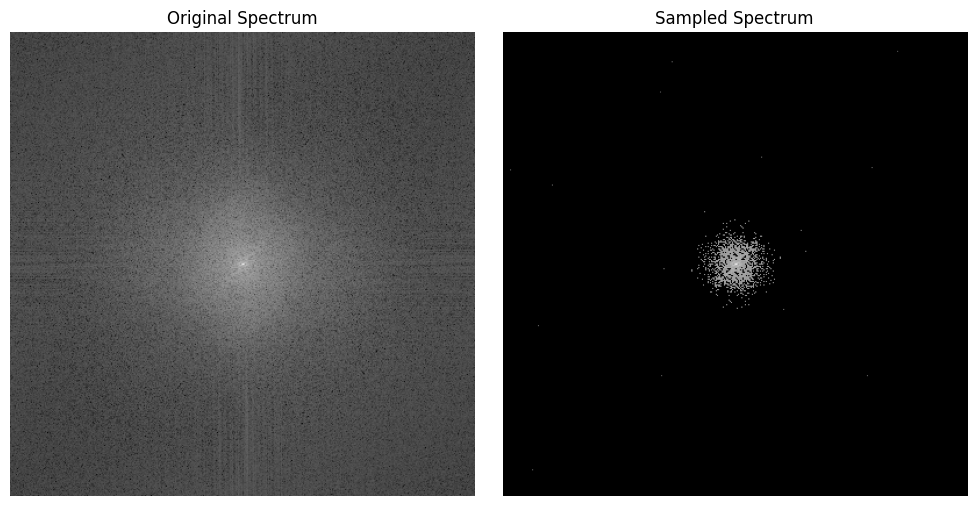

Actual CR: 123.36160370084811


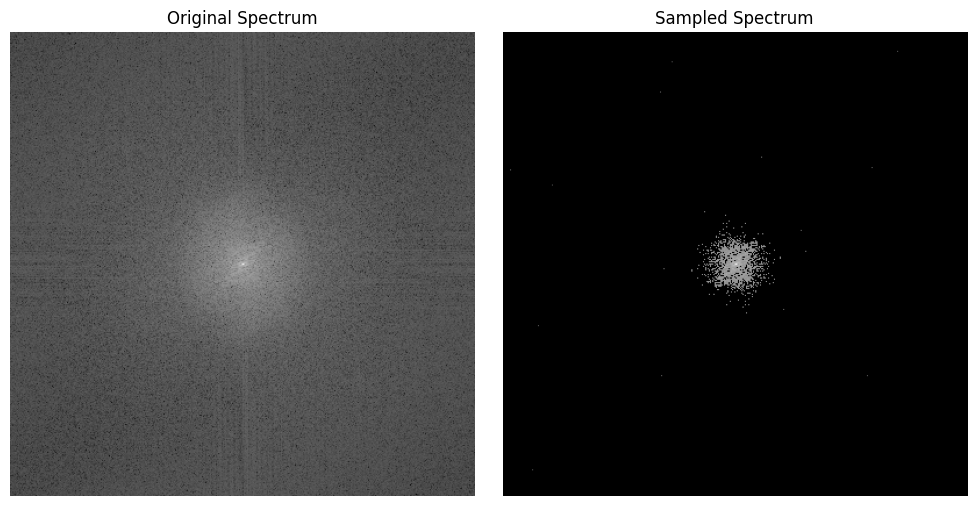

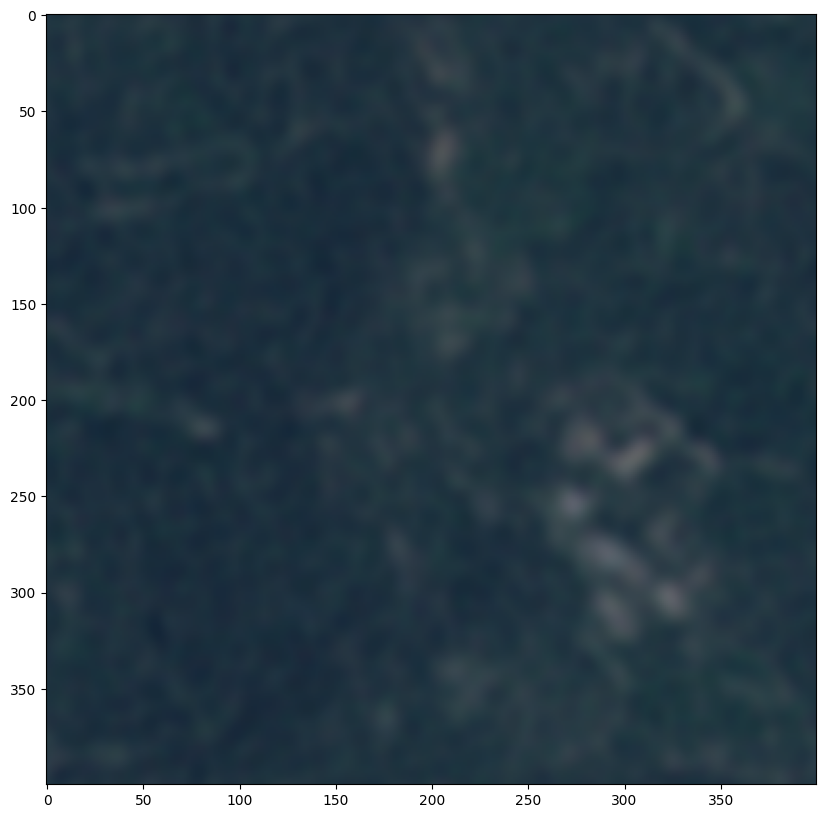

(400, 400, 3)
(400, 400, 3)
0.9361241696753062


In [23]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np
from skimage.metrics import structural_similarity as compare_ssim
from PIL import Image

def compute_ssim(img1, img2):
    # Ensure the images have the same shape
    print(img1.shape)
    print(img2.shape)
    assert img1.shape == img2.shape, "The images must have the same size and number of channels"

    # Compute SSIM for each channel
    ssim_r = compare_ssim(img1[:,:,0], img2[:,:,0])
    ssim_g = compare_ssim(img1[:,:,1], img2[:,:,1])
    ssim_b = compare_ssim(img1[:,:,2], img2[:,:,2])

    # Average the SSIM values of the channels
    ssim_avg = (ssim_r + ssim_g + ssim_b) / 3

    return ssim_avg

# path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_44.jpg'

direct_path = '/mnt/raid0sata1/chuanhao/CA/cropped/2021-07-01_2276.npy'

mod = np.load(direct_path, allow_pickle=True)[0]*255
image_ = np.load(direct_path, allow_pickle=True)[0]*255

mod = mod.astype(np.uint8)
image_ = image_.astype(np.uint8)

# modulate masks
# image = Image.open(path)
# image = image.convert('RGB')
# mod = np.array(image)
print(mod.shape)
print(mod.max())
print(mod.min())

mod[-1, -1, 0] = 0
mod[-1, -1, 1] = 0
mod[-1, -1, 2] = 0
mod[-2, -2, 0] = 255
mod[-2, -2, 1] = 255
mod[-2, -2, 2] = 255

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(mod)
plt.show()

# compress and decompress oringinal image
# Read the image and separate RGB channels
# image_ = Image.open(path)
# image_ = image.convert('RGB')
# image_ = np.array(image_)

red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

# compress and decompress modulated image
red_channel_m = mod[:,:,0]
green_channel_m = mod[:,:,1]
blue_channel_m = mod[:,:,2]

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel_m.shape, 0.0001)
cr=125
# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel_m, mask_m, cr=cr, mode='keep')
compressed_green_m = plot_comparison_spectrum(green_channel_m, mask_m, cr=cr, mode='keep')
compressed_blue_m = plot_comparison_spectrum(blue_channel_m, mask_m, cr=cr, mode='keep')

# # Compressive sensing reconstruction for each channel
# reconstructed_red_m = compressive_sensing_reconstruction(red_channel_m, mask_m, mode='quantile', cr=50)
# reconstructed_green_m = compressive_sensing_reconstruction(green_channel_m, mask_m, mode='quantile', cr=50)
# reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel_m, mask_m, mode='quantile', cr=50)

# #scale back to 0-255
# reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
# reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
# reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# # Combine reconstructed channels
# reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
# io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)
# plt.figure(figsize=(10,10))
# plt.imshow(reconstructed_image_m)
# plt.show()

compressed_image_m = np.stack([np.abs(ifft2(compressed_red_m)), np.abs(ifft2(compressed_green_m)), np.abs(ifft2(compressed_blue_m))], axis=-1).astype(np.uint8)
plt.figure(figsize=(10,10))
plt.imshow(compressed_image_m)
plt.show()

# compute ssim
ssim = compute_ssim(image_, compressed_image_m)
print(ssim)

(400, 400, 3)
116
20


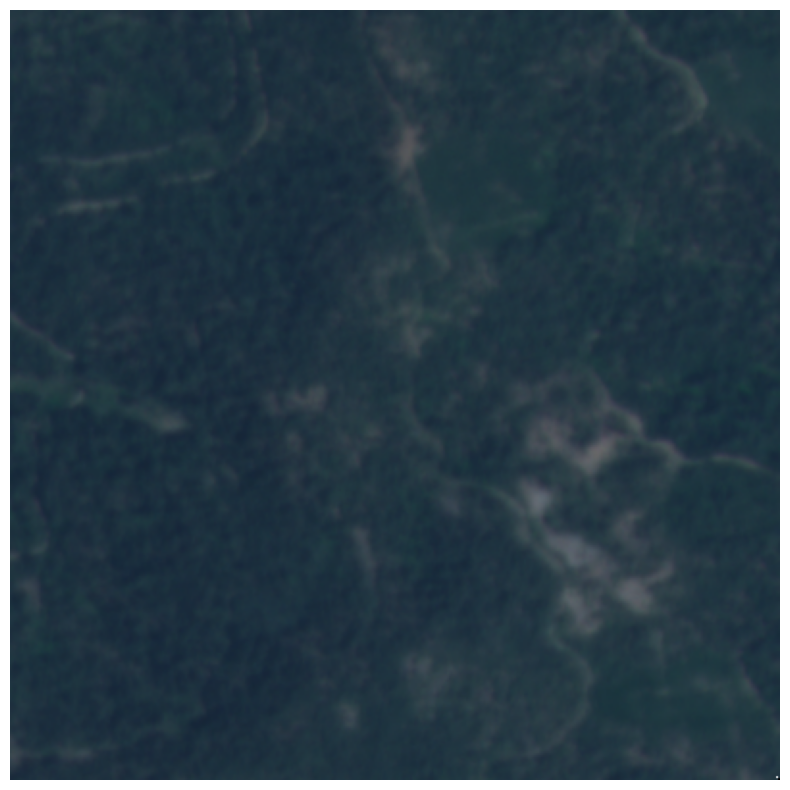

Actual CR: 4.9179320095899675


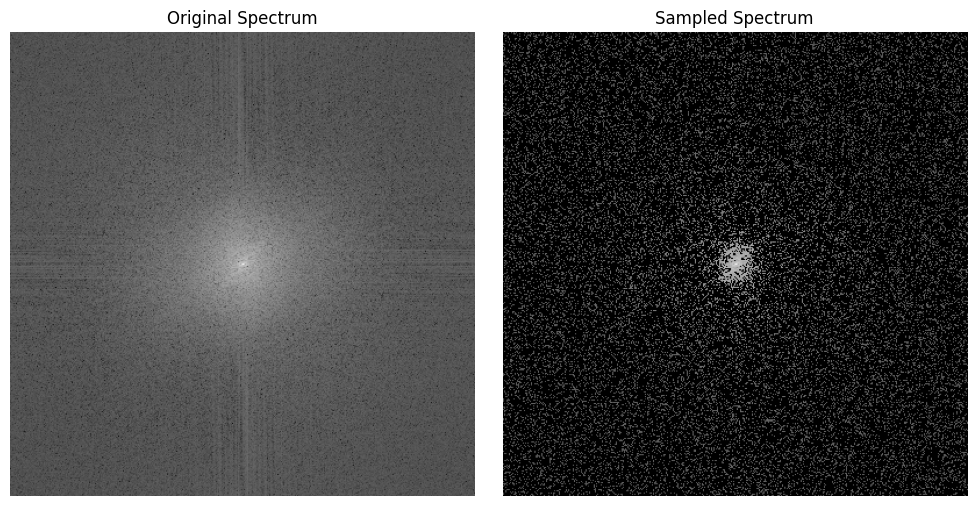

Actual CR: 4.9179320095899675


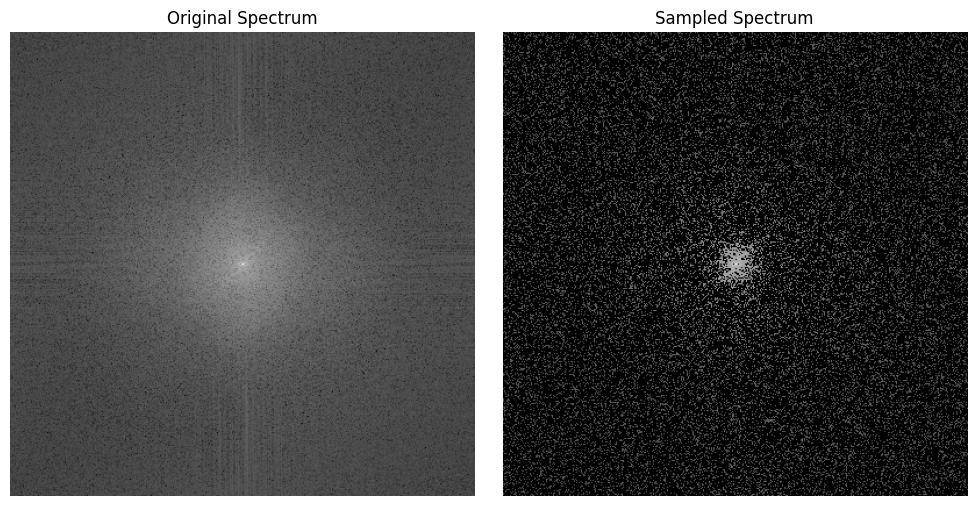

Actual CR: 4.9179320095899675


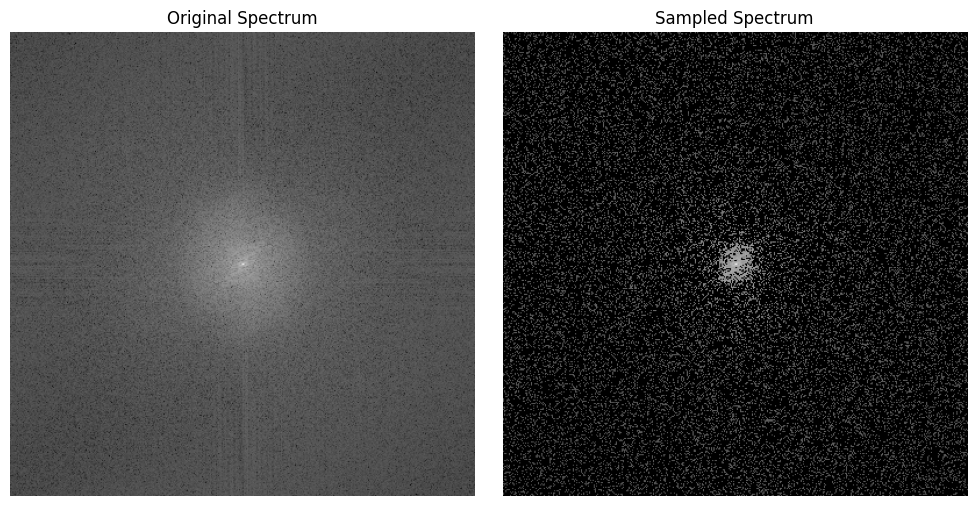

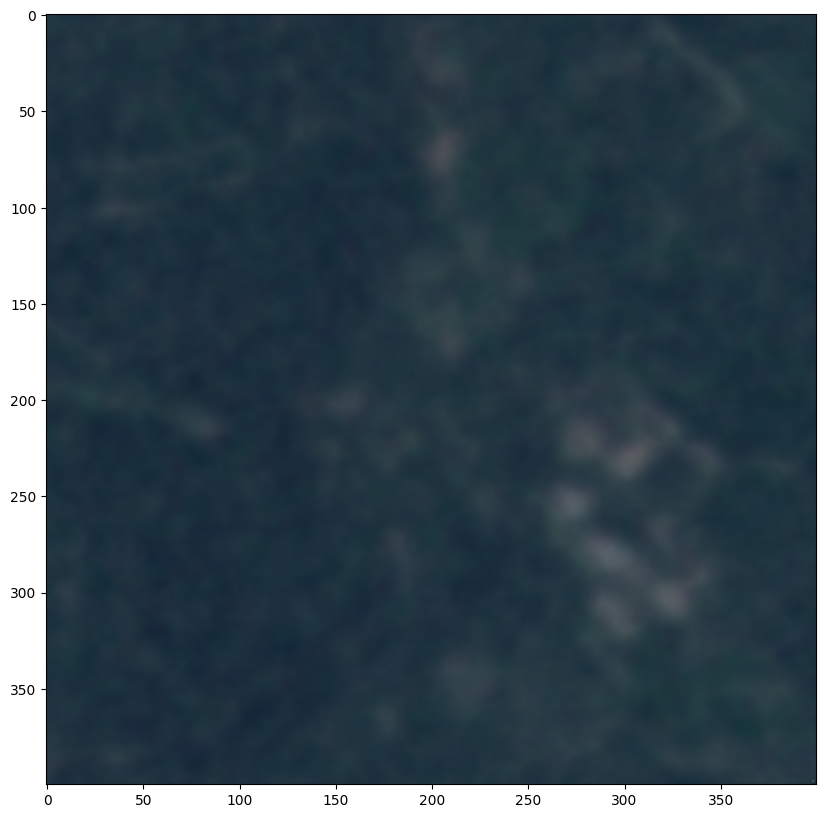

(400, 400, 3)
(400, 400, 3)
0.9418178841100935


In [16]:
from mycompress import *
from matplotlib import pyplot as plt
from skimage import io, color
import numpy as np
from skimage.metrics import structural_similarity as compare_ssim
from PIL import Image

def compute_ssim(img1, img2):
    # Ensure the images have the same shape
    print(img1.shape)
    print(img2.shape)
    assert img1.shape == img2.shape, "The images must have the same size and number of channels"

    # Compute SSIM for each channel
    ssim_r = compare_ssim(img1[:,:,0], img2[:,:,0])
    ssim_g = compare_ssim(img1[:,:,1], img2[:,:,1])
    ssim_b = compare_ssim(img1[:,:,2], img2[:,:,2])

    # Average the SSIM values of the channels
    ssim_avg = (ssim_r + ssim_g + ssim_b) / 3

    return ssim_avg

# path = '/mnt/data/chuanhao/segment-anything/amazon/planet/planet/train-jpg/train_44.jpg'

direct_path = '/mnt/raid0sata1/chuanhao/CA/cropped/2021-07-01_2276.npy'

mod = np.load(direct_path, allow_pickle=True)[0]*255
image_ = np.load(direct_path, allow_pickle=True)[0]*255

mod = mod.astype(np.uint8)
image_ = image_.astype(np.uint8)

# modulate masks
# image = Image.open(path)
# image = image.convert('RGB')
# mod = np.array(image)
print(mod.shape)
print(mod.max())
print(mod.min())

mod[-1, -1, 0] = 0
mod[-1, -1, 1] = 0
mod[-1, -1, 2] = 0
mod[-2, -2, 0] = 255
mod[-2, -2, 1] = 255
mod[-2, -2, 2] = 255

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(mod)
plt.show()

# compress and decompress oringinal image
# Read the image and separate RGB channels
# image_ = Image.open(path)
# image_ = image.convert('RGB')
# image_ = np.array(image_)

red_channel = image_[:,:,0]
green_channel = image_[:,:,1]
blue_channel = image_[:,:,2]

# compress and decompress modulated image
red_channel_m = mod[:,:,0]
green_channel_m = mod[:,:,1]
blue_channel_m = mod[:,:,2]

# Generate a random sampling mask (using 25% sampling rate as an example)
mask_m = random_sampling_mask(red_channel_m.shape, 0.2)
cr=300
# compress the image
compressed_red_m = plot_comparison_spectrum(red_channel_m, mask_m, cr=cr, mode='keep')
compressed_green_m = plot_comparison_spectrum(green_channel_m, mask_m, cr=cr, mode='keep')
compressed_blue_m = plot_comparison_spectrum(blue_channel_m, mask_m, cr=cr, mode='keep')

# # Compressive sensing reconstruction for each channel
# reconstructed_red_m = compressive_sensing_reconstruction(red_channel_m, mask_m, mode='quantile', cr=50)
# reconstructed_green_m = compressive_sensing_reconstruction(green_channel_m, mask_m, mode='quantile', cr=50)
# reconstructed_blue_m = compressive_sensing_reconstruction(blue_channel_m, mask_m, mode='quantile', cr=50)

# #scale back to 0-255
# reconstructed_red_m = reconstructed_red_m/reconstructed_red_m.max() * red_channel.max()
# reconstructed_green_m = reconstructed_green_m/reconstructed_green_m.max() * green_channel.max()
# reconstructed_blue_m = reconstructed_blue_m/reconstructed_blue_m.max() * blue_channel.max()

# # Combine reconstructed channels
# reconstructed_image_m = np.stack([reconstructed_red_m, reconstructed_green_m, reconstructed_blue_m], axis=-1).astype(np.uint8)
# io.imsave('reconstructed_m10_2.jpg', reconstructed_image_m)
# plt.figure(figsize=(10,10))
# plt.imshow(reconstructed_image_m)
# plt.show()

compressed_image_m = np.stack([np.abs(ifft2(compressed_red_m)), np.abs(ifft2(compressed_green_m)), np.abs(ifft2(compressed_blue_m))], axis=-1).astype(np.uint8)
plt.figure(figsize=(10,10))
plt.imshow(compressed_image_m)
plt.show()

# compute ssim
ssim = compute_ssim(image_, compressed_image_m)
print(ssim)